In [1]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
#plt.rcParams['figure.figsize']=(6,6)
#plt.rcParams['font.weight']='bold'
#plt.rcParams['axes.labelweight']='bold'
#plt.rcParams['lines.linewidth']=1.5
#plt.rcParams['lines.markeredgewidth']=2
%matplotlib inline
%config InlineBackend.figure_format = "retina"

sys.path.append('/Applications/OpenFUSIONToolkit/python')
from OpenFUSIONToolkit.TokaMaker import TokaMaker
from OpenFUSIONToolkit.TokaMaker.meshing import load_gs_mesh
from OpenFUSIONToolkit.TokaMaker.util import create_isoflux, read_eqdsk

from omfit_classes.omfit_eqdsk import boundaryShape

In [2]:
mygs = TokaMaker()
mesh_pts,mesh_lc,mesh_reg,coil_dict,cond_dict = load_gs_mesh('nextstep_mesh_rev_nolim.h5')
mygs.setup_mesh(mesh_pts, mesh_lc, mesh_reg)
mygs.setup_regions(cond_dict=cond_dict,coil_dict=coil_dict)
mygs.setup(order=2,F0=1*3)

coil_reg_mat = np.zeros((mygs.ncoils+1,mygs.ncoils+1), dtype=np.float64)
targets = np.zeros(mygs.ncoils+1)
coil_weights = 0.5*np.ones(mygs.ncoils+1)

#Constrain CS current
coil_reg_mat[0,0] = 1
coil_reg_mat[1,1] = 1
coil_reg_mat[1,0] = -1
coil_reg_mat[2,2] = 1
coil_reg_mat[2,1] = -1

targets[0] = -3E6

coil_weights[:3] = 5

#Enforce up/down symmetry in PF coils
coil_reg_mat[3,3] = 1
coil_reg_mat[3,7] = -1
coil_reg_mat[4,4] = 1
coil_reg_mat[4,8] = -1
coil_reg_mat[5,5] = 1
coil_reg_mat[5,9] = -1
coil_reg_mat[6,6] = 1
coil_reg_mat[6,10] = -1

mygs.set_coil_reg(coil_reg_mat, targets, coil_weights)

#Set upper bound on coil currents
coil_bounds = np.zeros((mygs.ncoils+1,2), dtype=np.float64)
coil_bounds[:,0] = -1.E11; coil_bounds[:,1] = 1.E11

#Set upper bounds on divertor coils
coil_bounds[-5:-1, 0] = -122448.979592
coil_bounds[-5:-1, 1] = 122448.979592
coil_bounds[-5:-1, 0] = 0
coil_bounds[-5:-1, 1] = 0

mygs.set_coil_bounds(coil_bounds)

# Define shape of P' anf FF' profiles
n_sample = 40
psi_sample = np.linspace(0.0,1.0,n_sample)
# Set F*F' profile
alpha = 2
gamma = 1.25
ffp_prof = {
    'type': 'linterp',
    'x': psi_sample,
    'y': np.power(1.0-np.power(psi_sample,alpha),gamma)
}
ffp_prof['y'] /= ffp_prof['y'][0] # Normalize profile (not required but convienient)
# Set P' profile
alpha = 2
gamma = 1.25
pp_prof = {
    'type': 'linterp',
    'x': psi_sample,
    'y': np.power(1.0-np.power(psi_sample,alpha),gamma)
}
pp_prof['y'] /= pp_prof['y'][0] # Normalize profile (not required but convienient)

mygs.set_profiles(ffp_prof=ffp_prof,pp_prof=pp_prof)

# set global targets
Ip_target = 0.75E6
mygs.set_targets(Ip = Ip_target, Ip_ratio=1.0)

#----------------------------------------------
Open FUSION Toolkit Initialized
Development branch:   main
Revision id:          aba6d8f
Parallelization Info:
  Not compiled with MPI
  # of OpenMP threads =    2
Fortran input file    = oftpyin                                                                         
XML input file        = none                                                                            
Integer Precisions    =    4   8
Float Precisions      =    4   8  16
Complex Precisions    =    4   8
LA backend            = native
#----------------------------------------------


**** Generating surface grid level  1
  Generating boundary domain linkage
  Mesh statistics:
    Area         =  5.098E+00
    # of points  =    6874
    # of edges   =   20499
    # of cells   =   13626
    # of boundary points =     120
    # of boundary edges  =     120
    # of boundary cells  =     120
  Resolution statistics:
    hmin =  3.000E-03
    hrms =  3.129E-02
    hmax =  1.1

Starting non-linear GS solver
     1  9.7119E+00  4.4435E+00  2.2692E-02  1.0480E+00  6.3451E-05 -0.0000E+00
     2  7.5445E+00  3.5138E+00  4.1422E-03  1.0467E+00  4.9401E-05 -0.0000E+00
     3  7.0616E+00  3.3094E+00  1.1169E-03  1.0455E+00  3.8365E-05 -0.0000E+00
     4  6.8999E+00  3.2412E+00  8.2700E-04  1.0449E+00  3.1572E-05 -0.0000E+00
     5  6.8443E+00  3.2178E+00  4.6230E-04  1.0446E+00  2.7889E-05 -0.0000E+00
     6  6.8259E+00  3.2101E+00  2.2130E-04  1.0444E+00  2.5875E-05 -0.0000E+00
     7  6.8203E+00  3.2077E+00  9.6683E-05  1.0444E+00  2.4770E-05 -0.0000E+00
     8  6.8188E+00  3.2071E+00  3.9524E-05  1.0444E+00  2.4169E-05 -0.0000E+00
     9  6.8185E+00  3.2069E+00  1.5271E-05  1.0444E+00  2.3846E-05 -0.0000E+00
    10  6.8185E+00  3.2069E+00  5.5931E-06  1.0444E+00  2.3674E-05 -0.0000E+00
    11  6.8185E+00  3.2069E+00  1.9363E-06  1.0444E+00  2.3583E-05 -0.0000E+00
    12  6.8185E+00  3.2069E+00  6.2997E-07  1.0444E+00  2.3535E-05 -0.0000E+00
 Timing:  0.2181000000

Starting non-linear GS solver
     1  7.6810E+00  3.6365E+00  1.9186E-02  1.0357E+00  3.6719E-04 -0.0000E+00
     2  6.3027E+00  3.0015E+00  3.2414E-03  1.0363E+00  2.9135E-04 -0.0000E+00
     3  5.9793E+00  2.8540E+00  1.0097E-03  1.0362E+00  2.3265E-04 -0.0000E+00
     4  5.8613E+00  2.7995E+00  7.4834E-04  1.0361E+00  1.9429E-04 -0.0000E+00
     5  5.8156E+00  2.7779E+00  4.3392E-04  1.0361E+00  1.7151E-04 -0.0000E+00
     6  5.7979E+00  2.7692E+00  2.2294E-04  1.0361E+00  1.5850E-04 -0.0000E+00
     7  5.7912E+00  2.7658E+00  1.0758E-04  1.0361E+00  1.5122E-04 -0.0000E+00
     8  5.7887E+00  2.7644E+00  4.9947E-05  1.0361E+00  1.4720E-04 -0.0000E+00
     9  5.7879E+00  2.7639E+00  2.2582E-05  1.0361E+00  1.4500E-04 -0.0000E+00
    10  5.7876E+00  2.7637E+00  1.0020E-05  1.0361E+00  1.4380E-04 -0.0000E+00
    11  5.7875E+00  2.7636E+00  4.3906E-06  1.0361E+00  1.4315E-04 -0.0000E+00
    12  5.7875E+00  2.7636E+00  1.9114E-06  1.0361E+00  1.4279E-04 -0.0000E+00
    13  5.7875E+00  2.

Starting non-linear GS solver
     1  6.7150E+00  3.2117E+00  2.0437E-02  1.0377E+00  3.8937E-05 -0.0000E+00
     2  6.4258E+00  3.0825E+00  3.5484E-03  1.0379E+00  2.7730E-05 -0.0000E+00
     3  6.3426E+00  3.0470E+00  7.4908E-04  1.0379E+00  1.9152E-05 -0.0000E+00
     4  6.3113E+00  3.0339E+00  2.1669E-04  1.0378E+00  1.3925E-05 -0.0000E+00
     5  6.2990E+00  3.0287E+00  9.4689E-05  1.0378E+00  1.0921E-05 -0.0000E+00
     6  6.2941E+00  3.0267E+00  4.7237E-05  1.0377E+00  9.2585E-06 -0.0000E+00
     7  6.2921E+00  3.0260E+00  2.3216E-05  1.0377E+00  8.3639E-06 -0.0000E+00
     8  6.2914E+00  3.0257E+00  1.0998E-05  1.0377E+00  6.8701E-06 -0.0000E+00
     9  6.2910E+00  3.0255E+00  5.0414E-06  1.0377E+00  6.4481E-06 -0.0000E+00
    10  6.2909E+00  3.0255E+00  2.2513E-06  1.0377E+00  6.3429E-06 -0.0000E+00
    11  6.2909E+00  3.0255E+00  9.8488E-07  1.0377E+00  6.2524E-06 -0.0000E+00
 Timing:   5.1155440004076809     
   Source:     2.4395079991081730     
   Solve:      1.5811349999

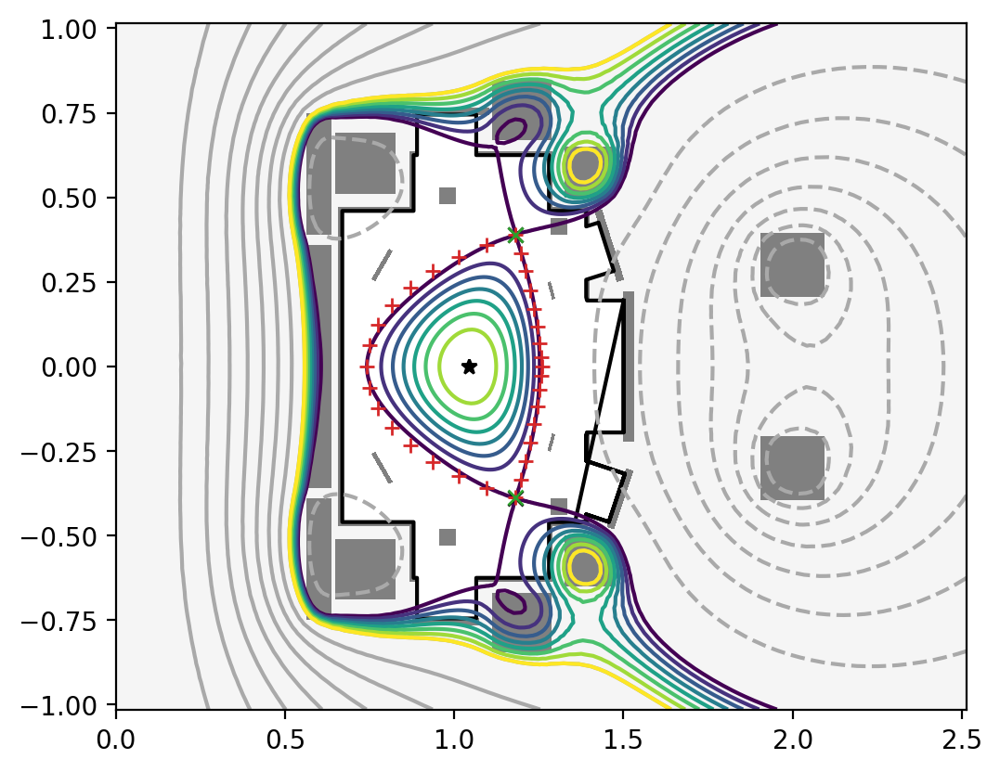

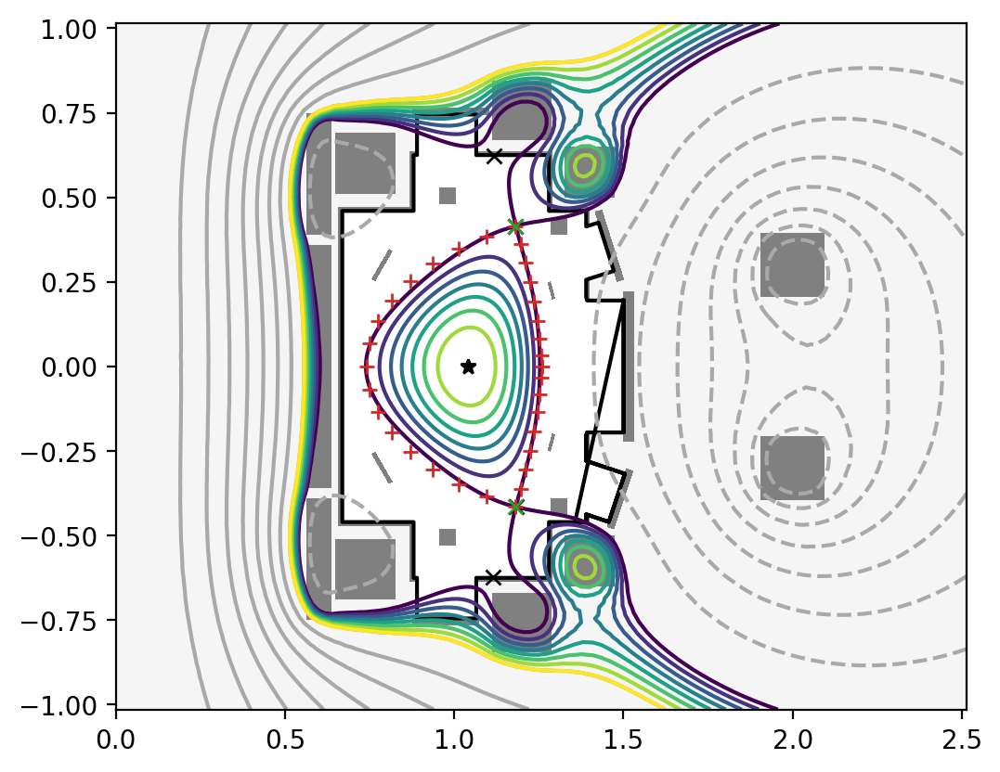

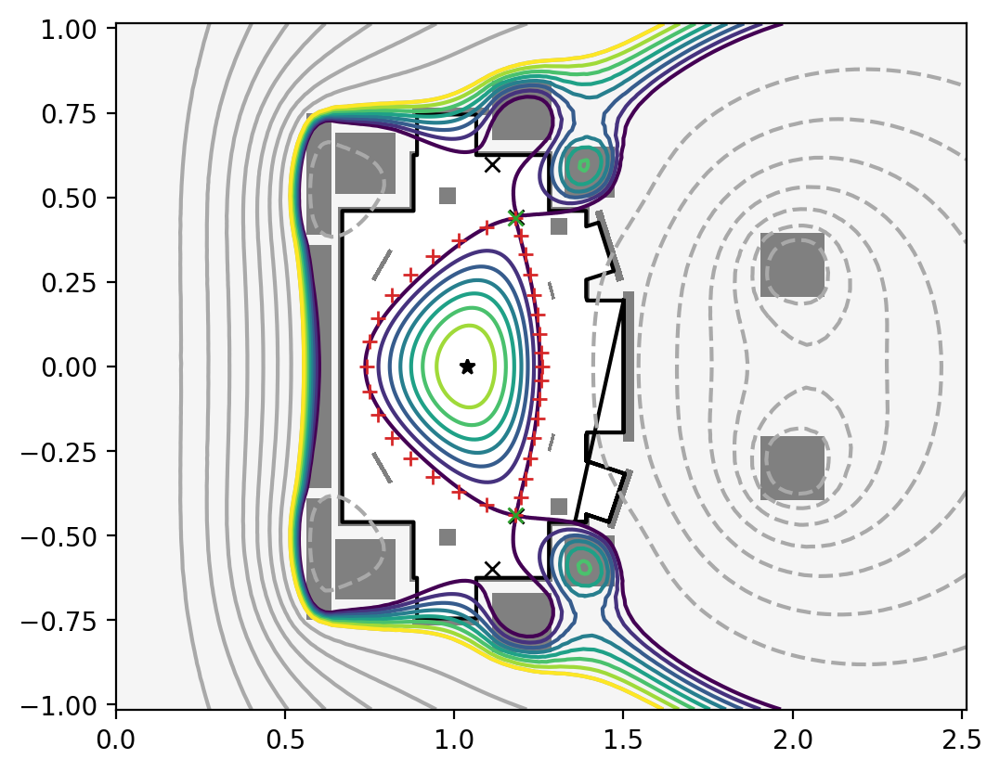

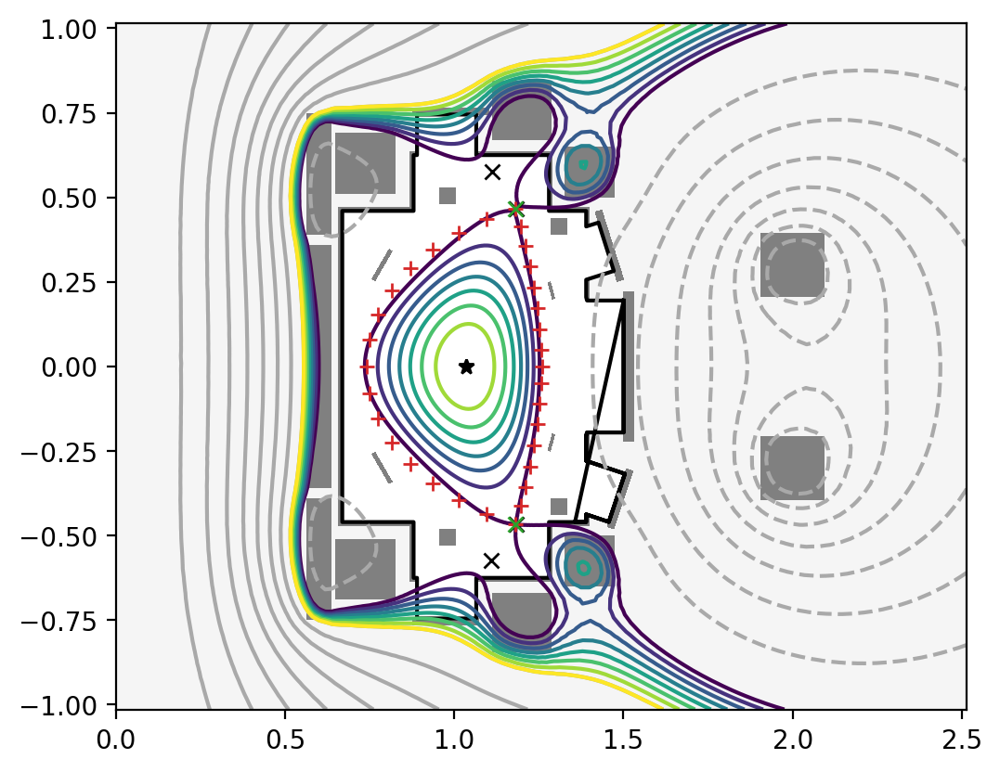

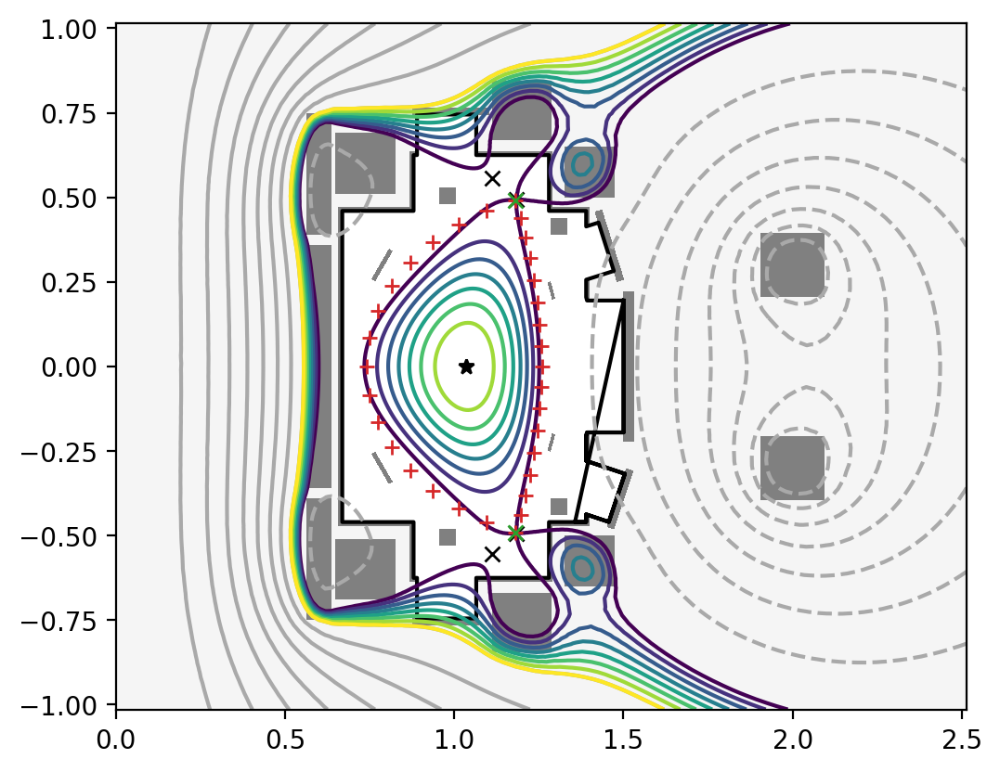

...

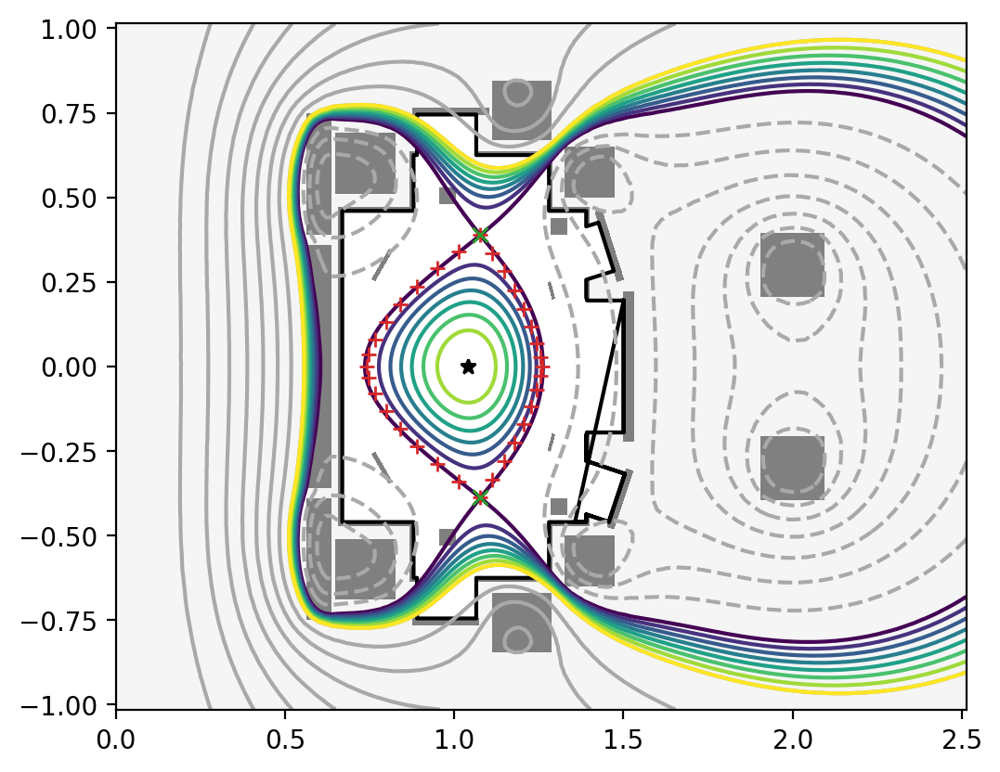

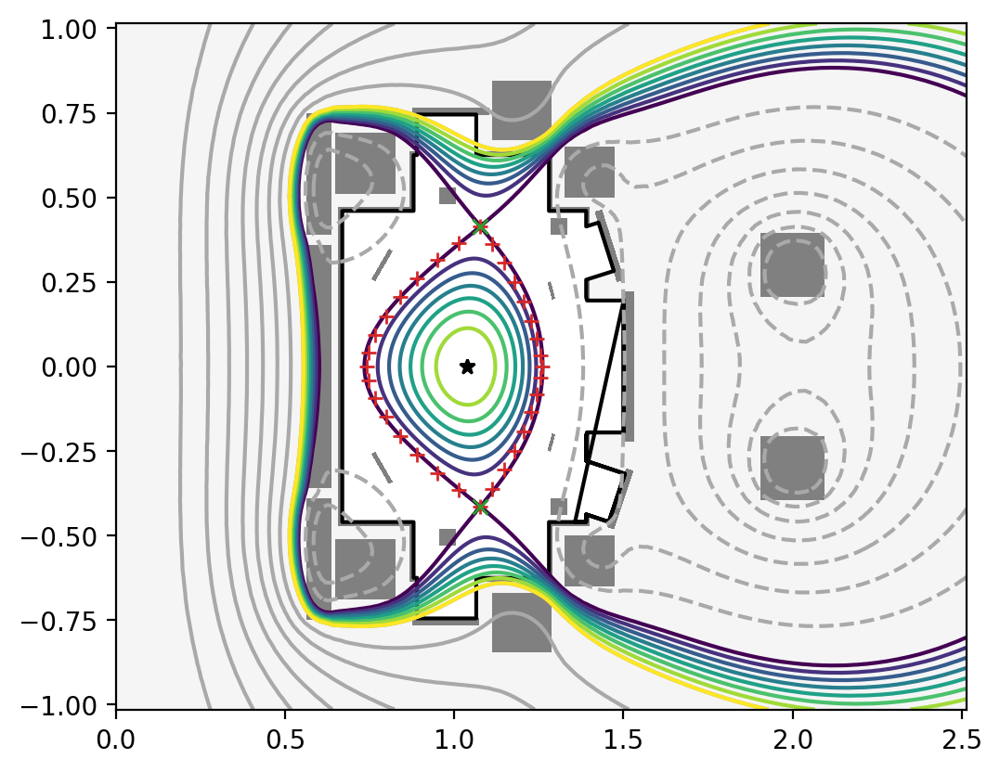

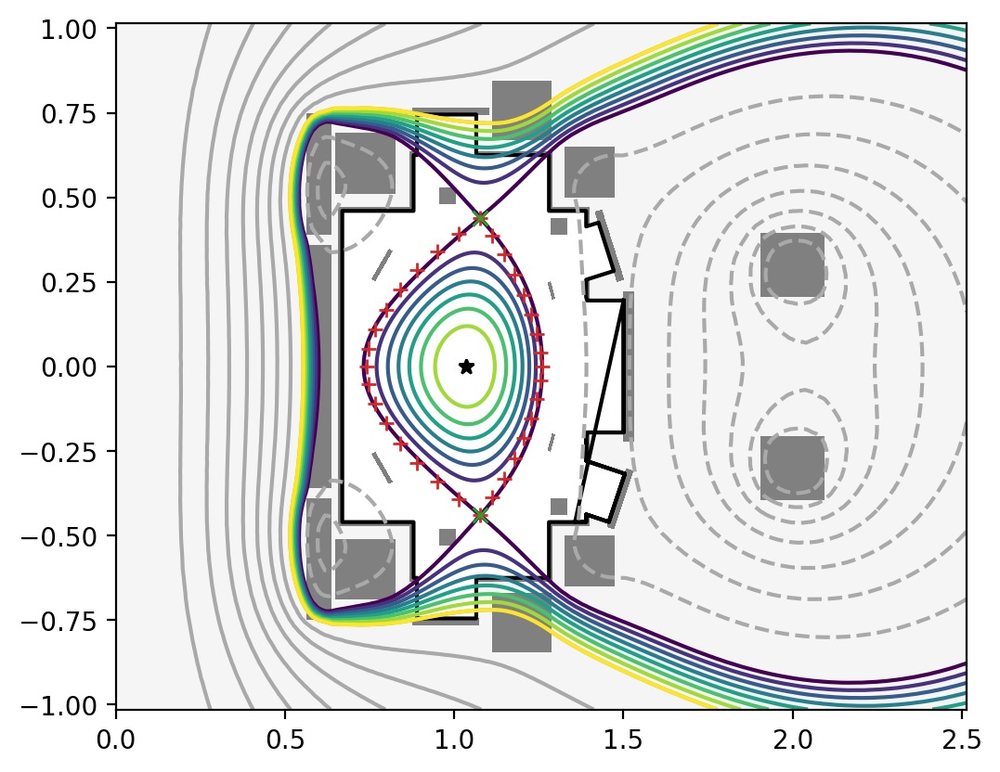

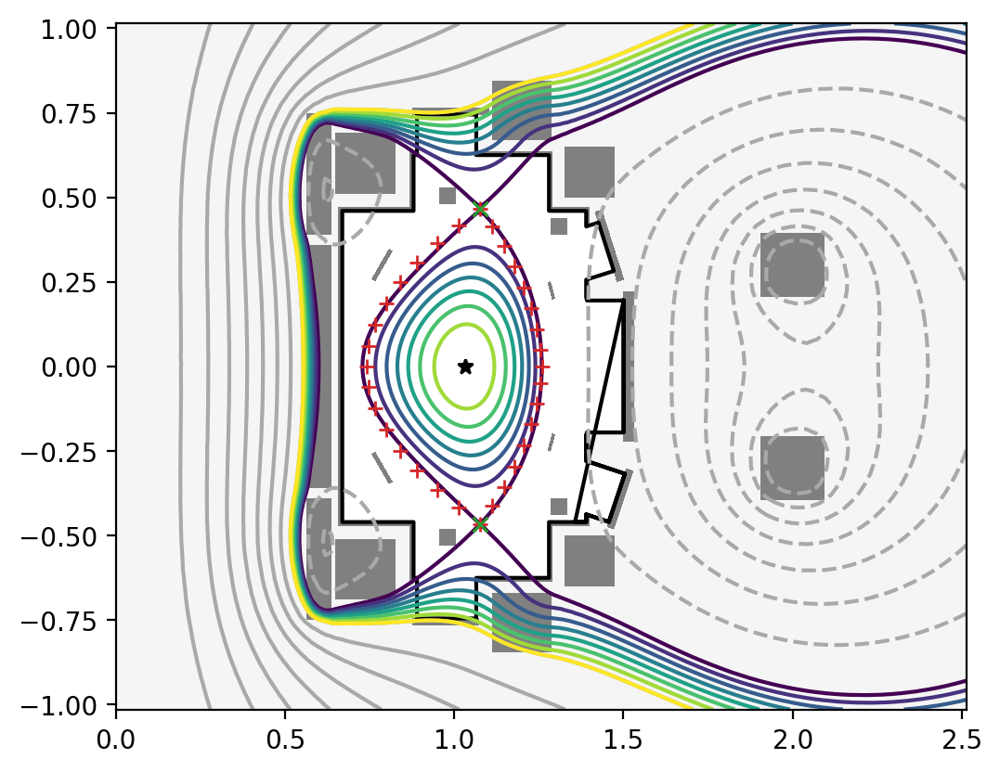

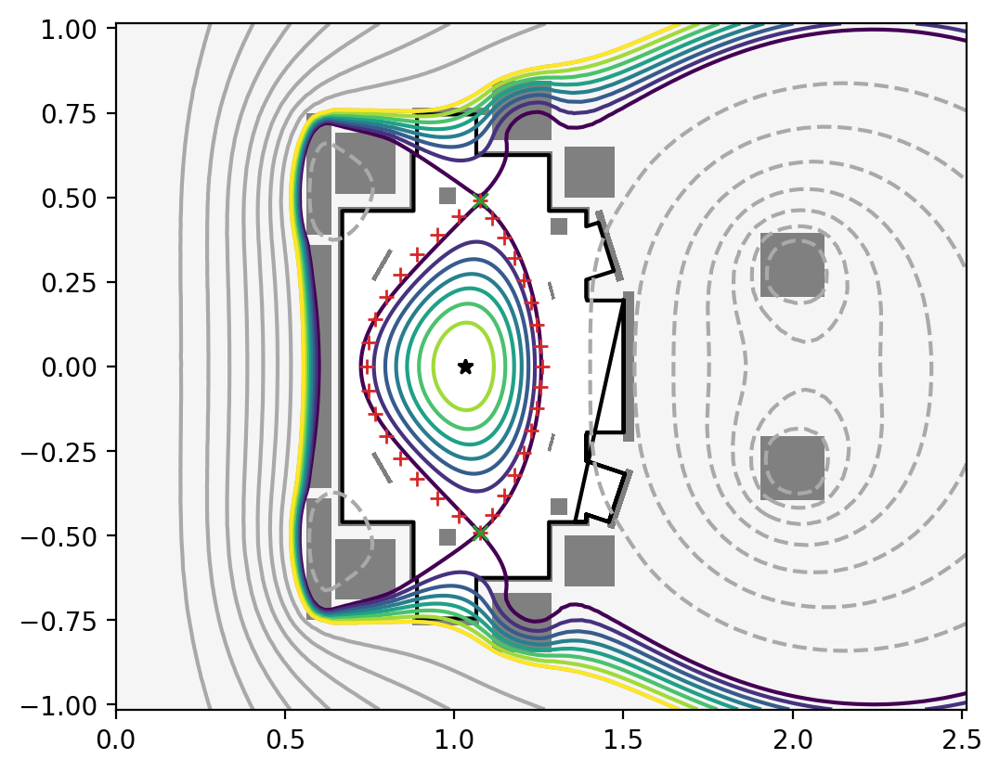

In [3]:
ds = np.linspace(-0.7, -.3, 5)
es = np.linspace(1.5, 1.9, 5)

deltas = []
kappas = []
q_95s = []
gammas = []
taus = []

for d in ds:
    for e in es:
        r, z, zeff = boundaryShape(kapu = e, kapl = e, delu = d, dell = d, zetail = 0, zetaiu = 0, zetaou = 0, zetaol = 0, a = 0.2588, eps = 0.2588/1, zoffset = 0, upnull = True, lonull = True, npts = 8)
        boundary = np.column_stack((r,z))
        boundary = np.nan_to_num(boundary)

        x_points = np.zeros((2,2))
        x_points[0,:] = boundary[np.argmin(boundary[:,1]),:]
        x_points[1,:] = boundary[np.argmax(boundary[:,1]),:]
        x_weights = 50*np.ones(2)
        mygs.set_saddles(x_points, x_weights)

        strike_ul = [1.06, 0.55]
        strike_ur = [1.255, 0.495]

        strike_ll = np.copy(strike_ul)
        strike_ll[1] = -strike_ul[1]
        strike_lr = np.copy(strike_ur)
        strike_lr[1] = -strike_ur[1]

        #boundary = np.vstack((boundary, strike_ul, strike_ll, strike_lr, strike_ur))
        isoflux_weights = 50*np.ones(len(boundary))
        #isoflux_weights[-4:] = 500

        mygs.set_isoflux(boundary, isoflux_weights)

        mygs.init_psi(0.68,0,0.2, 1.8,0.3)
        mygs.settings.maxits = 100
        mygs.update_settings()
        mygs.solve()

        stats = mygs.get_stats()
        deltas.append(np.min((stats['deltaU'], stats['deltaL'])))
        kappas.append(np.max((stats['kappaU'], stats['kappaL'])))
        q_95s.append(stats['q_95'])
        eig_vals, eig_vecs = mygs.eig_td(-1.E5,10, include_bounds = True)
        gammas.append(eig_vals[0,0])

        fig, ax = plt.subplots()
        mygs.plot_machine(fig,ax)
        mygs.plot_psi(fig,ax)
        mygs.plot_constraints(fig, ax)

In [4]:
print(q_95s)

[1.9496487322275506, 2.156082818934157, 2.366170976262492, 2.583431046903866, 2.806847804805979, 1.8965995319640123, 2.0871144407083806, 2.286982352728914, 2.480092117685242, 2.663872977818177, 1.8767930230789123, 2.066485698884682, 2.256312127555817, 2.4541900008819058, 2.645083758188484, 1.8527916327911098, 2.041482732367429, 2.2441602076549554, 2.453333842558224, 2.6573964188213837, 1.8380810681954738, 2.0259256458898713, 2.2291777650415905, 2.446084725423368, 2.6823814359102904]


Text(0, 0.5, '$\\kappa$')

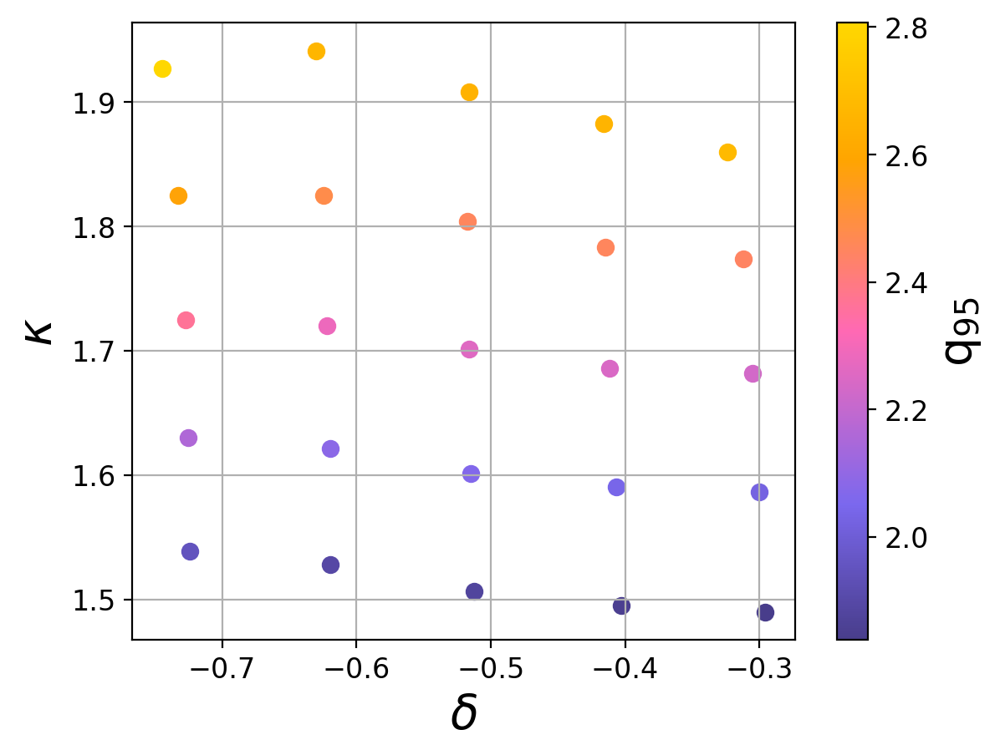

In [5]:
import matplotlib as mpl
plt.rcParams['xtick.labelsize'] = 'large'
plt.rcParams['ytick.labelsize'] = 'large'
norm = plt.Normalize(np.min(q_95s), np.max(q_95s))
cmap = mpl.cm.plasma(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:,:-1])
from matplotlib.colors import LinearSegmentedColormap
colors = ["rebeccapurple","mediumpurple", "royalblue", "lightseagreen", "mediumaquamarine"]
colors = ["darkslateblue","mediumslateblue","hotpink","orange", "gold"]
nodes = [0.,0.22,  0.5, 0.78,1]
cmap1 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
norm = plt.Normalize(np.min(q_95s), np.max(q_95s))
c = cmap1(norm(q_95s))
for i in range(len(deltas)):
    plt.scatter(deltas[i],kappas[i], color = c[i], s = 45)

sm = plt.cm.ScalarMappable(cmap=cmap1, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label = r'$\mathrm{q}_{95}$', size = 20)
plt.grid()
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)


Text(0, 0.5, '$\\kappa$')

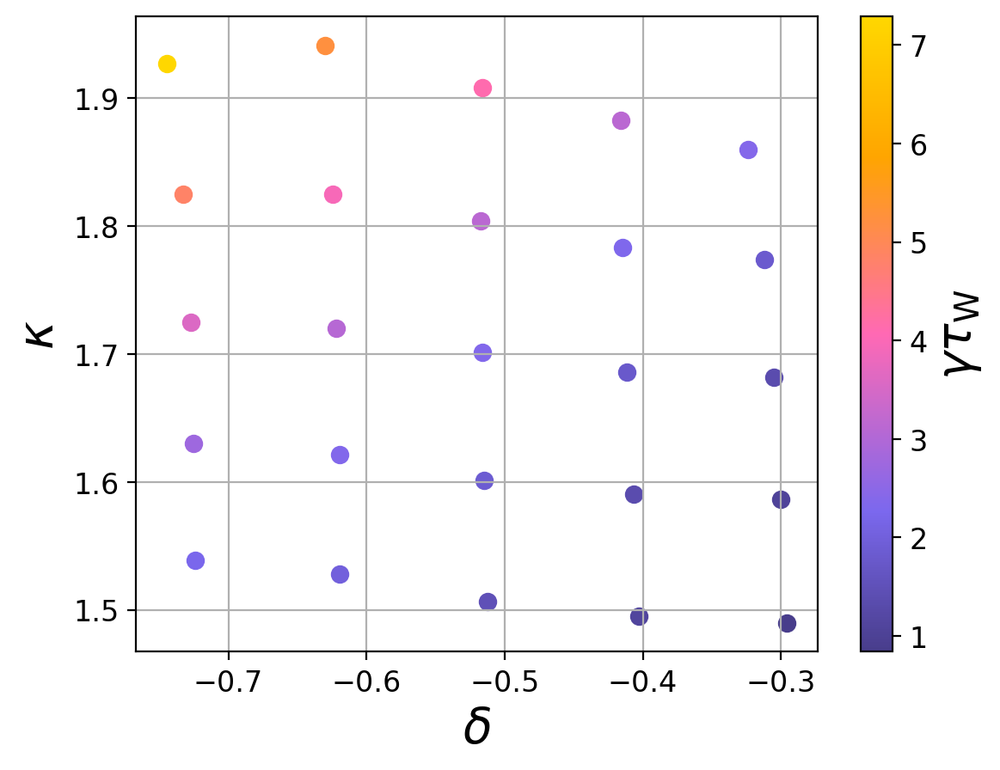

In [11]:
import matplotlib as mpl
plt.rcParams['xtick.labelsize'] = 'large'
plt.rcParams['ytick.labelsize'] = 'large'
cmap = mpl.cm.plasma(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:,:-1])
from matplotlib.colors import LinearSegmentedColormap
colors = ["rebeccapurple","mediumpurple", "royalblue", "lightseagreen", "mediumaquamarine"]
colors = ["darkslateblue","mediumslateblue","hotpink","orange", "gold"]
nodes = [0.,0.22,  0.5, 0.78,1]
cmap1 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
norm = plt.Normalize(np.min(-0.00581697*np.array(gammas)), np.max(-0.00581697*np.array(gammas)))
c = cmap1(norm(-0.00581697*np.array(gammas)))
for i in range(len(deltas)):
    plt.scatter(deltas[i],kappas[i], color = c[i], s = 45)

sm = plt.cm.ScalarMappable(cmap=cmap1, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label = r'$\gamma \tau_\mathrm{W}$', size = 20)
plt.grid()
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)
